
# 🌿 Виявлення хвороб рослин за допомогою Computer Vision

## 1. Імпортуємо необхідні бібліотеки та дані для роботи.

In [ ]:
import os
import math
import numpy as np
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision import models
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision import models
import torch.nn as nn
from sklearn.metrics import classification_report, confusion_matrix
from torch.utils.data import random_split, DataLoader

In [ ]:
!git clone https://github.com/spMohanty/PlantVillage-Dataset

Cloning into 'PlantVillage-Dataset'...
remote: Enumerating objects: 163235, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 163235 (delta 2), reused 0 (delta 0), pack-reused 163229 (from 1)
Receiving objects: 100% (163235/163235), 2.00 GiB | 16.56 MiB/s, done.
Resolving deltas: 100% (101/101), done.
Updating files: 100% (182401/182401), done.


In [ ]:
!mkdir -p data/PlantVillage
!cp -r PlantVillage-Dataset/raw/color/* data/PlantVillage/

In [ ]:
from google.colab import files
!zip -r data.zip data
files.download("data.zip")

Показано результат, скорочений до останніх рядків (5000).
  adding: data/PlantVillage/Soybean___healthy/16e9331f-3b7b-462c-8cd1-eca3ed0b5b9d___RS_HL 6817.JPG (deflated 1%)
  adding: data/PlantVillage/Soybean___healthy/5e7795bd-adb3-4ef2-b86f-6cd19cbff894___RS_HL 5680.JPG (deflated 1%)
  adding: data/PlantVillage/Soybean___healthy/6483b972-99c7-44f4-a842-d5abf873f1c3___RS_HL 3789.JPG (deflated 2%)
  adding: data/PlantVillage/Soybean___healthy/36b0770c-8274-4623-abed-39c691fbfc80___RS_HL 5629 1.JPG (deflated 2%)
  adding: data/PlantVillage/Soybean___healthy/bab94654-ff11-4a5a-8278-891945c19e04___RS_HL 2971.JPG (deflated 1%)
  adding: data/PlantVillage/Soybean___healthy/0fd2ab91-c29b-4879-a8b7-21c892eb716b___RS_HL 6997.JPG (deflated 1%)
  adding: data/PlantVillage/Soybean___healthy/728cd7bc-53e4-48ab-aa9a-b3c90d3a9fdf___RS_HL 3144.JPG (deflated 1%)
  adding: data/PlantVillage/Soybean___healthy/f6665415-a556-4210-96d5-41e4443ad70b___RS_HL 6293.JPG (deflated 2%)
  adding: data/PlantVillage/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

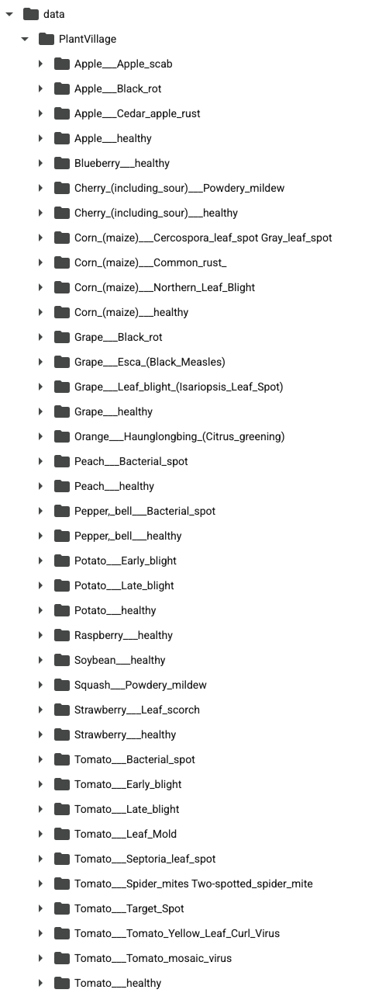

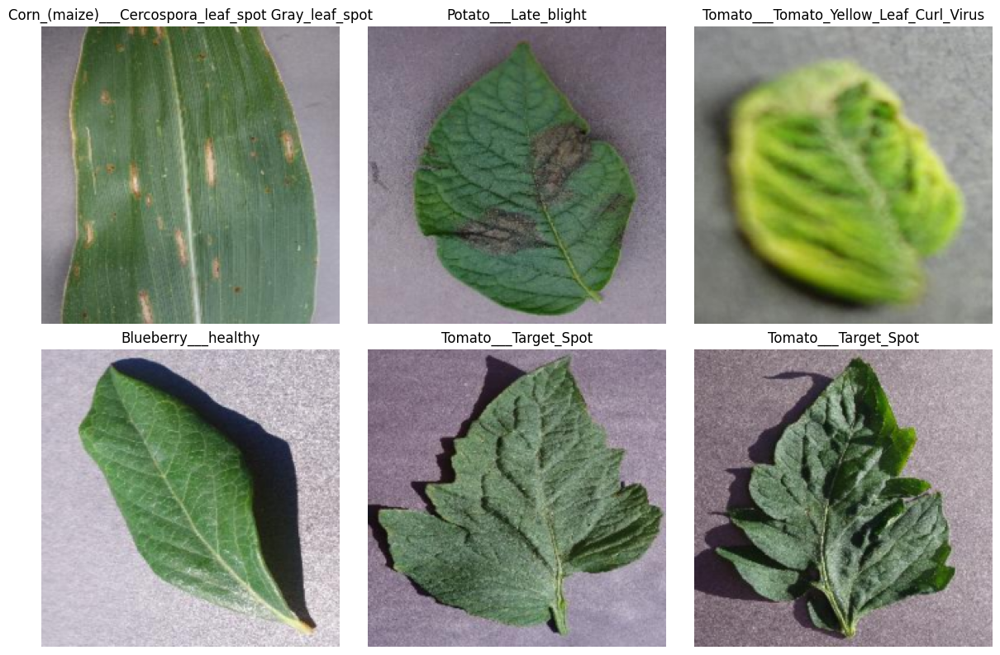

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

dataset = ImageFolder('data/PlantVillage', transform=transform)
class_names = dataset.classes

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for i in range(6):
    img, label = dataset[np.random.randint(len(dataset))]
    ax = axes[i // 3, i % 3]
    img = img.permute(1, 2, 0).numpy()  # CxHxW -> HxWxC - дозволяє правильно відобразити зображення у imshow
    ax.imshow(img)
    ax.set_title(class_names[label])
    ax.axis('off')

plt.tight_layout()
plt.show()

## 2. Завантаження та трансформація зображень

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

DATA_DIR = 'data/PlantVillage'
dataset = ImageFolder(DATA_DIR, transform=transform)
class_names = dataset.classes
print(f"Класи: {class_names}")

# Розділення на train і val
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# DataLoader-и
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

Класи: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Ta

## 3. Побудова та тренування моделі (ResNet18 + Transfer Learning)

In [ ]:
model = models.resnet18(pretrained=True)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 204MB/s]


In [ ]:
model.fc = nn.Linear(model.fc.in_features, len(class_names))

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
EPOCHS = 5
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Епоха {epoch+1}/{EPOCHS}, Втрати: {running_loss / len(train_loader):.4f}")

100%|██████████| 1358/1358 [04:02<00:00,  5.60it/s]


Епоха 1/5, Втрати: 0.2951


100%|██████████| 1358/1358 [03:57<00:00,  5.72it/s]


Епоха 2/5, Втрати: 0.1186


100%|██████████| 1358/1358 [03:56<00:00,  5.74it/s]


Епоха 3/5, Втрати: 0.0920


100%|██████████| 1358/1358 [03:57<00:00,  5.73it/s]


Епоха 4/5, Втрати: 0.0670


100%|██████████| 1358/1358 [03:54<00:00,  5.79it/s]

Епоха 5/5, Втрати: 0.0664


## 4. Оцінка моделі

In [ ]:
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

# Звіт
print(classification_report(y_true, y_pred, target_names=class_names))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.91      0.95       115
                                 Apple___Black_rot       0.93      0.99      0.96       117
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        58
                                   Apple___healthy       0.97      0.96      0.97       340
                               Blueberry___healthy       1.00      0.98      0.99       309
          Cherry_(including_sour)___Powdery_mildew       1.00      0.99      0.99       202
                 Cherry_(including_sour)___healthy       0.40      1.00      0.57       163
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.76      1.00      0.86        91
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       201
               Corn_(maize)___Northern_Leaf_Blight       0.97      0.85      0.

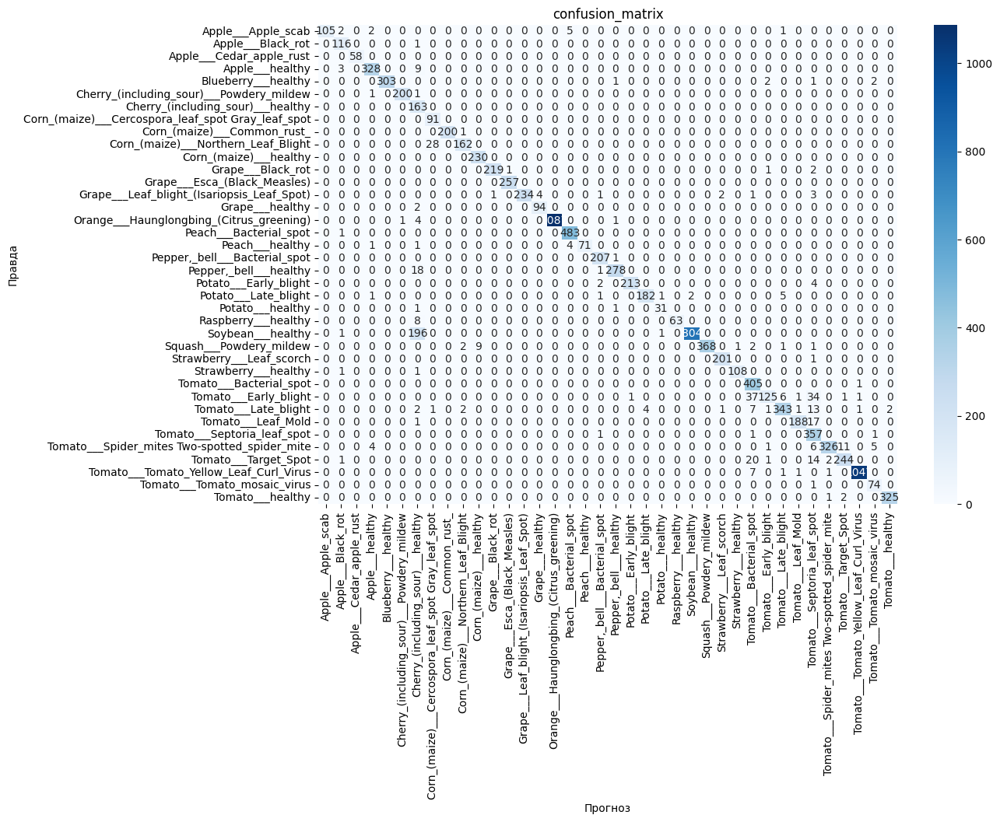

In [ ]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.xlabel('Прогноз')
plt.ylabel('Правда')
plt.title('confusion_matrix')
plt.show()

## Пояснення результатів

Загальні метрики:
- accuracy = 0.95 — це 95% точність на валідаційному наборі, тобто 95 з 100 зображень модель класифікує правильно
- macro avg (F1) = 0.94 — добре збалансована точність по всіх класах (незалежно від кількості прикладів)
- weighted avg (F1) = 0.95 — показує, що навіть по "великих" класах модель працює чудово


Цікаві спостереження:
- Tomato___Tomato_Yellow_Leaf_Curl_Virus — 99% точність, незважаючи на великий клас (1057 прикладів)
Cherry___healthy має дивний результат:
- precision = 0.40, але recall = 1.00 - це може вказувати на overfitting або схожість із іншими класами
- Tomato___Early_blight трохи просідає по recall (0.61) — можливо, його часто плутають з іншими "плямистими" хворобами

In [ ]:
torch.save(model.state_dict(), "plant_disease_model.pth")

## 5. Прогнозування на нових зображеннях

In [ ]:
from PIL import Image

def predict_image(image_path, model, class_names):
    model.eval()  # режим оцінки
    img = Image.open(image_path).convert('RGB')

    # ті самі трансформації, що й під час тренування
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

    img_tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        _, predicted = torch.max(outputs, 1)

    predicted_class = class_names[predicted.item()]
    return predicted_class

In [ ]:
image_path = '/content/data/PlantVillage/Apple___Black_rot/0090d05d-d797-4c99-abd4-3b9cb323a5fd___JR_FrgE.S 8727.JPG'
result = predict_image(image_path, model, class_names)
print(f"Передбачено: {result}")

Передбачено: Apple___Black_rot


In [ ]:
image_path = '/content/data/PlantVillage/Peach___healthy/017d3d86-12bf-4280-8929-10dcd504ac46___Rutg._HL 3671.JPG'
result = predict_image(image_path, model, class_names)
print(f"Передбачено: {result}")

Передбачено: Peach___healthy


In [ ]:
image_path = '/content/data/PlantVillage/Potato___Early_blight/0182e991-97f0-4805-a1f7-6e1b4306d518___RS_Early.B 7015.JPG'
result = predict_image(image_path, model, class_names)
print(f"Передбачено: {result}")

Передбачено: Potato___Early_blight


In [ ]:
# model = models.resnet18(pretrained=False)
# model.fc = nn.Linear(model.fc.in_features, len(class_names))
# model.load_state_dict(torch.load("plant_disease_model.pth"))
# model = model.to(device)

In [ ]:
def show_predictions_grid(dataset, model, class_names, n):
    model.eval()
    indices = random.sample(range(len(dataset)), n)

    cols = min(n, 5)
    rows = math.ceil(n / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten()

    for i, idx in enumerate(indices):
        image, true_label = dataset[idx]
        input_tensor = image.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)
            _, pred_label = torch.max(output, 1)

        img_np = image.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np * np.array([0.229, 0.224, 0.225]) +
                  np.array([0.485, 0.456, 0.406]))
        img_np = np.clip(img_np, 0, 1)

        title_color = "green" if pred_label.item() == true_label else "red"
        axes[i].imshow(img_np)
        axes[i].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label.item()]}",
            color=title_color, fontsize=10
        )
        axes[i].axis("off")

    for j in range(n, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

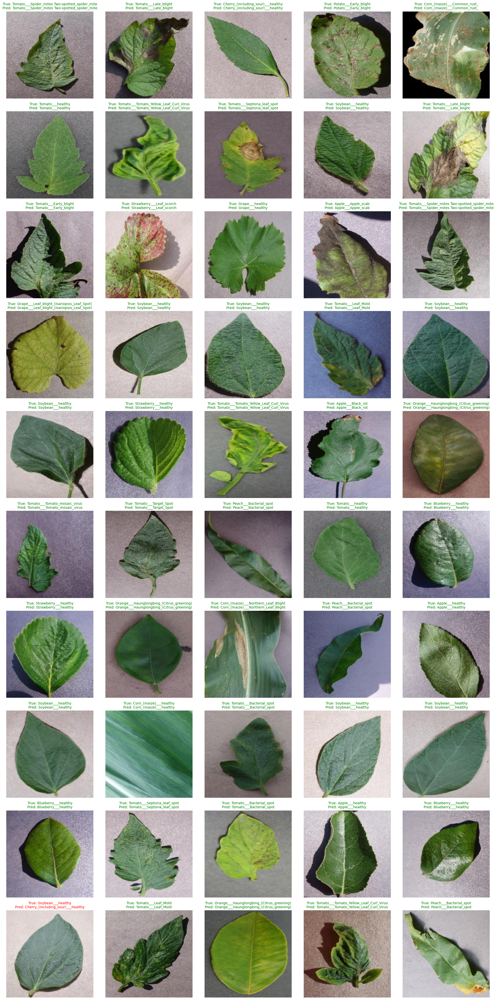

In [ ]:
show_predictions_grid(dataset, model, class_names, n=50)